# New Image Extractor Code

In [2]:
import os
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# 加载ResNet-50模型，将其设为评估模式
model = models.resnet50(pretrained=True).to('cuda')
model.eval()

# 创建预处理函数
preprocess = transforms.Compose([
    transforms.Resize(256), # 将图片缩放到256x256大小
    transforms.CenterCrop(224), # 从中心裁剪出224x224大小的图片
    transforms.ToTensor(), # 将图片转换为Tensor格式
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # 对图片进行归一化
])

# 指定文件夹路径
folder_path = '/ssd1/holdenhu/Amazon2014_dataset/Amazon_Beauty/image' 

# 读取文件夹中的所有图片，保存为一个列表，并将图片的路径也存到列表当中
images = []
image_paths = []
for filename in os.listdir(folder_path):
    img_path = os.path.join(folder_path, filename)
    img = Image.open(img_path).convert('RGB')
    images.append(img)
    image_paths.append(img_path)


# 将图片列表拆分成若干个batch，每个batch包含batch_size张图片
batch_size = 1000
n_batches = len(images) // batch_size
if len(images) % batch_size != 0:
    n_batches += 1

# 对每个batch中的所有图片进行特征提取，并保存到一个数组中
features_list = []
for i in range(n_batches):
    batch_images = images[i*batch_size:(i+1)*batch_size]# 从images列表中获取一个批次的图像数据，范围是从i*batch_size到(i+1)*batch_size

    # 对batch中的所有图片进行预处理，并将其转换为4D张量（batch_size=batch_size）
    batch_tensor = torch.zeros((len(batch_images), 3, 224, 224)).to('cuda') # 创建一个全零张量，形状为 (len(batch_images), 3, 224, 224)，并将其转移到GPU
    for j, img in enumerate(batch_images):
        img_tensor = preprocess(img)# 调用与图片预处理函数，将一个batch中的所有图片转换成张量
        batch_tensor[j] = img_tensor# 将转换后的张量img_tensor存储在batch_tensor列表的第j个位置

    # 使用ResNet-50模型提取图片特征
    with torch.no_grad():
        features = model(batch_tensor)

    # 将特征向量转换为numpy数组，并将其添加到特征列表中
    features_np = features.squeeze().cpu().numpy()
    features_list.append(features_np)

# 将特征数组保存到文件中
features_array = np.concatenate(features_list, axis=0)#进行了一个连接操作，行增多了
# np.save('features.npy', features_array)
# np.save('image_paths.npy', np.array(image_paths))

In [4]:
features_array.shape

(12094, 1000)

In [5]:
# @_@: PCA降维 目的是用较少的变量来代替原来较多的变量，并可以反映原来多个变量的大部分信息----最后
import numpy as np
from sklearn.decomposition import IncrementalPCA

# 加载特征数组
# features_array = np.load('features.npy')

# 指定降维后的维数
n_components = 18

# 创建增量PCA对象，并指定batch_size和n_components参数
batch_size = 1000
ipca = IncrementalPCA(n_components=n_components, batch_size=batch_size) # 创建一个IncrementalPCA对象，设置主成分数量为18(希望从数据中提取出18个最重要的特征或维度)，最大迭代次数为1000

# 逐批次对特征数组进行降维
for epoch in range(3):
    for i in range(0, len(features_array), batch_size):#len(features_array)返回的是features_array的行数
        batch = features_array[i:i+batch_size]
        ipca.partial_fit(batch) #学习数据的主成分
        

# 对所有特征进行降维
features_reduced = ipca.transform(features_array) #features_reduced:18*1000

# 保存降维后的特征数组
# np.save('features_reduced.npy', features_reduced)

In [10]:
# @_@: AE降维
import torch
import torch.nn as nn
import math 

# 加载特征数组
# features_array = np.load('features.npy')

# 定义自编码器模型  维度变化：input_dim-encoding_dim-input_dim
class LinearAutoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim):
        super(LinearAutoencoder, self).__init__()
        self.encoder = nn.Sequential(  #创建了一个编码器
            nn.Linear(input_dim, encoding_dim),
            nn.Sigmoid()
        )
        self.decoder = nn.Sequential( #创建一个解码器
            nn.Linear(encoding_dim, input_dim),
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# 指定输入和编码维度
input_dim = features_array.shape[1]
encoding_dim = 64

# 定义自编码器模型并初始化
autoencoder = LinearAutoencoder(input_dim, encoding_dim).to('cuda') #创建自动编码器对象

# 定义损失函数和优化器
criterion = nn.MSELoss() #均方误差损失
optimizer = torch.optim.Adam(autoencoder.parameters(), lr=0.001) #autoencoder.parameters()获取自动编码器的参数

# 训练自编码器模型
num_epochs = 1000
batch_size = 256
echo_num = 10
best_state = None
smallest_loss, bad_epoch, bad_epoch_top = math.inf, 0, 3 # when the loss is bigger than the last for n times, stop
# data = torch.tensor(features_array, dtype=torch.float)
for epoch in range(num_epochs):#逐轮次进行处理
    loss_sum = 0
    for i in range(0, len(features_array), batch_size): #使用图像特征数组数据对自动编码器进行训练
        batch = torch.tensor(features_array[i:i+batch_size], dtype=torch.float).to('cuda')# 从特征数组中获取一个批次的数据，并将其转换为张量
        # 正向传播
        output = autoencoder(batch)
        loss = criterion(output, batch)
        loss_sum += loss
        # 反向传播和优化
        optimizer.zero_grad()# 清空优化器的梯度缓存，准备进行新的一轮参数更新
        loss.backward()# 反向传播计算损失函数的梯度
        optimizer.step()# 根据计算出的梯度更新模型参数
    if epoch%echo_num == 0: #判断是否已经是否已经训练所有的轮次，若是，则输出所有损失函数值的和
        print(loss_sum)
        if loss_sum >= smallest_loss:
            bad_epoch += 1
        else:
            bad_epoch = 0
            smallest_loss = loss_sum
            best_state = autoencoder.state_dict()# 保存当前模型状态
        if bad_epoch == bad_epoch_top: # 如果坏迭代次数达到预设的阈值，提前终止训练，并打印终止时的迭代次数
            print('early stop at epoch {}'.format(epoch))
            break

autoencoder.load_state_dict(best_state)# 加载最佳模型参数到自动编码器中，好像默认是None
# 对所有特征进行降维
features_tensor = torch.tensor(features_array, dtype=torch.float).cuda() #将numpy数组features_array转换为张量
features_reduced = autoencoder.encoder(features_tensor).cpu().detach().numpy()#使用预训练的自动编码器（autoencoder）对特征张量进行编码，得到压缩后的特征 (12094, 18)


tensor(219.7868, device='cuda:0', grad_fn=<AddBackward0>)
tensor(72.5405, device='cuda:0', grad_fn=<AddBackward0>)
tensor(49.6325, device='cuda:0', grad_fn=<AddBackward0>)
tensor(39.7966, device='cuda:0', grad_fn=<AddBackward0>)
tensor(33.2046, device='cuda:0', grad_fn=<AddBackward0>)
tensor(28.9725, device='cuda:0', grad_fn=<AddBackward0>)
tensor(26.1011, device='cuda:0', grad_fn=<AddBackward0>)
tensor(24.0341, device='cuda:0', grad_fn=<AddBackward0>)
tensor(22.5704, device='cuda:0', grad_fn=<AddBackward0>)
tensor(21.4818, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.8701, device='cuda:0', grad_fn=<AddBackward0>)
tensor(20.0894, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.5946, device='cuda:0', grad_fn=<AddBackward0>)
tensor(19.1888, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.9388, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.8155, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.4141, device='cuda:0', grad_fn=<AddBackward0>)
tensor(18.2802, device='cuda:0

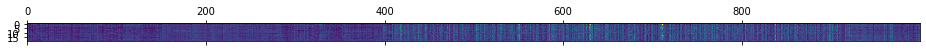

In [7]:
import matplotlib.pyplot as plt
import numpy as np
plt.matshow(features_array[:20])
plt.show()

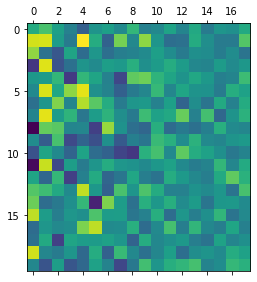

In [8]:
plt.matshow(features_reduced[:20])
plt.show()

(12094, 18)
STARTED CLUSTERING
[25  6 11 ... 28  7 15]
CLUSTER GROUPS


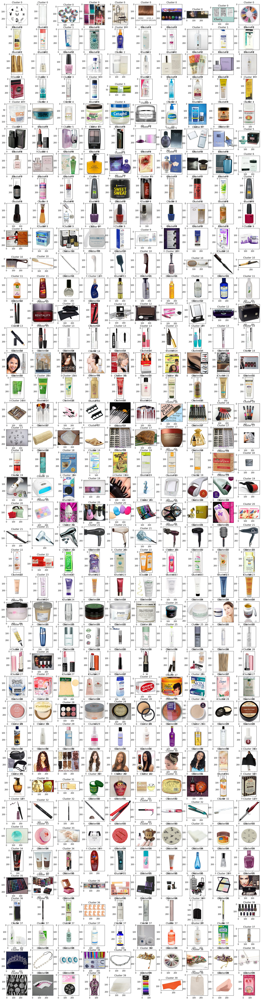

In [9]:
from sklearn.cluster import KMeans
#定义聚类函数
def cluster_images(image_feature_list, image_path_list, cluster_num=1):
    # image_feature_list = np.array(image_feature_list)
    print(image_feature_list.shape)
    img_feature_embedding = image_feature_list

    print('STARTED CLUSTERING')
    number_clusters = cluster_num#设置聚类的数量（默认=1）
    kmeans = KMeans(n_clusters=number_clusters, random_state=0).fit(np.array(img_feature_embedding))# 创建一个KMeans对象，并设置聚类的数量和随机状态# 使用fit方法对图像特征进行拟合
    print(kmeans.labels_)# 打印kmeans模型的标签结果

    image_cluster_dict = {}# 初始化一个空字典，用于存储聚类结果
    for i, m in enumerate(kmeans.labels_):
        image_cluster_dict[f'{m}'] = []

    print('CLUSTER GROUPS')
    for i, m in enumerate(kmeans.labels_):
        image_cluster_dict[f'{m}'].append(image_path_list[i])# 在字典中添加一个新的键，其名称为m（类别标签），值为一个空列表，将属于同一类别的所有图像添加到相应的列表中

    f, axarr = plt.subplots(cluster_num,10, figsize=(24, int(cluster_num*2.4)))
    for i in image_cluster_dict.keys():
        for j in range(10):
            im = Image.open(image_cluster_dict[i][j])
            axarr[int(i), j].imshow(np.array(im))
            axarr[int(i), j].set_title(f'Cluster {i}')
    plt.show()
    return image_cluster_dict, kmeans
    
image_cluster_dict, kmeans = cluster_images(features_reduced, image_paths, cluster_num=40) #features_reduced：12094*18；设置聚类的数量为40
label = kmeans.labels_

(12094, 64)
STARTED CLUSTERING
[37 19 24 ... 34 38 37]
CLUSTER GROUPS


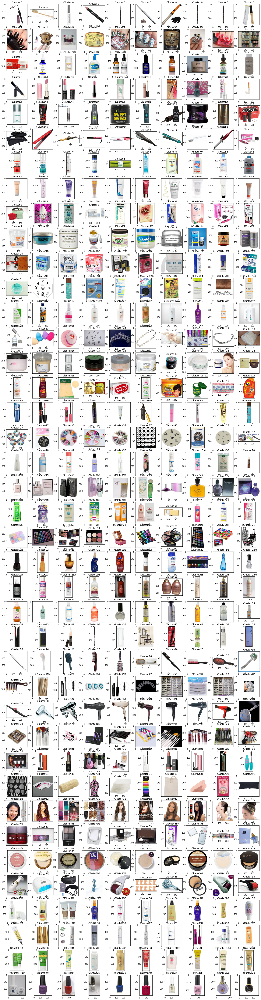

In [11]:
from sklearn.cluster import KMeans  

def cluster_images(image_feature_list, image_path_list, cluster_num=1): 
    # image_feature_list = np.array(image_feature_list)
    print(image_feature_list.shape)
    img_feature_embedding = image_feature_list

    print('STARTED CLUSTERING')
    number_clusters = cluster_num
    kmeans = KMeans(n_clusters=number_clusters, random_state=0).fit(np.array(img_feature_embedding))
    print(kmeans.labels_)

    image_cluster_dict = {}
    for i, m in enumerate(kmeans.labels_):
        image_cluster_dict[f'{m}'] = []

    print('CLUSTER GROUPS')
    for i, m in enumerate(kmeans.labels_):
        image_cluster_dict[f'{m}'].append(image_path_list[i])

    f, axarr = plt.subplots(cluster_num,10, figsize=(24, int(cluster_num*2.4)))
    for i in image_cluster_dict.keys():
        for j in range(10):
            im = Image.open(image_cluster_dict[i][j])
            axarr[int(i), j].imshow(np.array(im))
            axarr[int(i), j].set_title(f'Cluster {i}')
    plt.show()
    return image_cluster_dict, kmeans
    
image_cluster_dict, kmeans = cluster_images(features_reduced, image_paths, cluster_num=40)
label = kmeans.labels_